In [1]:
# image size check, resize if nedded to 64x64, and check if grayscale
import os
from PIL import Image

# Define the input directory
input_dir = 'C:/Users/odys_/Desktop/ML_winows_2/archive_original'

# Function to check and resize images to 64x64
def check_and_resize_images(directory, target_size=(64, 64)):
    resized_count = 0  # Counter for resized images
    non_grayscale_count = 0  # Counter for non-grayscale images
    converted_count = 0  # Counter for images converted to grayscale
    for category in os.listdir(directory):
        category_path = os.path.join(directory, category)
        if os.path.isdir(category_path):  # Ensure it's a directory
            print(f"Processing folder: {category}")
            for file_name in os.listdir(category_path):
                if file_name.endswith('.jpeg') or file_name.endswith('.png'):  # Check for valid image files
                    img_path = os.path.join(category_path, file_name)
                    try:
                        with Image.open(img_path) as img:
                            if img.size != target_size:  # Check if the image size is not 64x64
                                print(f"Resizing image: {img_path} (Current size: {img.size})")
                                img = img.resize(target_size)  # Resize to 64x64
                                img.save(img_path)  # Save the resized image
                                resized_count += 1  # Increment the counter
                            else:
                                print(f"Image already 64x64: {img_path}")
                            if img.mode != 'L':  # Check if the image is not grayscale
                                print(f"Non-grayscale image found: {img_path} (Mode: {img.mode})")
                                non_grayscale_count += 1
                                # Convert to grayscale
                                img = img.convert('L')
                                img.save(img_path)  # Save the converted image
                                converted_count += 1
                            else:
                                print(f"Grayscale image: {img_path}")

                    except Exception as e:
                        print(f"Error processing image {img_path}: {e}")
    print("--------------------------------------------------------")
    print(f"Total images resized to {target_size}: {resized_count}")
    print("--------------------------------------------------------")
    print(f"Total non-grayscale images: {non_grayscale_count}")
    print("--------------------------------------------------------")
    print(f"Total images converted to grayscale: {converted_count}")

# Run the function
check_and_resize_images(input_dir)

Processing folder: AbdomenCT
Image already 64x64: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000000.jpeg
Grayscale image: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000000.jpeg
Image already 64x64: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000001.jpeg
Grayscale image: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000001.jpeg
Image already 64x64: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000002.jpeg
Grayscale image: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000002.jpeg
Image already 64x64: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000003.jpeg
Grayscale image: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000003.jpeg
Image already 64x64: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000004.jpeg
Grayscale image: C:/Users/odys_/Desktop/ML_winows_2/archive_original\AbdomenCT\000004.jpeg
Image already 64x64: C:/Users/odys_/Deskt

KeyboardInterrupt: 

In [2]:
# Load images and labels


import numpy as np
import matplotlib.pyplot as plt


# Initialize lists to store images and labels
images = []
labels = []

# Loop through each folder (class name) in the input directory
for category in os.listdir(input_dir):
    category_path = os.path.join(input_dir, category)
    if os.path.isdir(category_path):  # Ensure it's a directory
        for file_name in os.listdir(category_path):
            if file_name.endswith('.jpeg') or file_name.endswith('.png'):  # Check for valid image files
                img_path = os.path.join(category_path, file_name)
                try:
                    # Open and preprocess the image
                    img = Image.open(img_path)
                    # img = img.resize((128, 128))  # Resize to 128x128
                    img_array = np.array(img)
                    
                    # Append the image and its label
                    images.append(img_array)
                    labels.append(category)  # Use the folder name as the label
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")

# Convert lists to numpy arrays
images = np.array(images)
labels = np.array(labels)

# Print some information about the loaded data
print(f"Loaded {len(images)} images.")
print(f"Image shape: {images[0].shape} ")
print(f"Labels: {np.unique(labels)}")


Loaded 58954 images.
Image shape: (64, 64) 
Labels: ['AbdomenCT' 'BreastMRI' 'CXR' 'ChestCT' 'Hand' 'HeadCT']


Label 'AbdomenCT' count: 10000
Label 'BreastMRI' count: 8954
Label 'CXR' count: 10000
Label 'ChestCT' count: 10000
Label 'Hand' count: 10000
Label 'HeadCT' count: 10000
classes_6: {'AbdomenCT': 10000, 'BreastMRI': 8954, 'CXR': 10000, 'ChestCT': 10000, 'Hand': 10000, 'HeadCT': 10000}


[Text(0, 0, '10000'),
 Text(0, 0, '8954'),
 Text(0, 0, '10000'),
 Text(0, 0, '10000'),
 Text(0, 0, '10000'),
 Text(0, 0, '10000')]

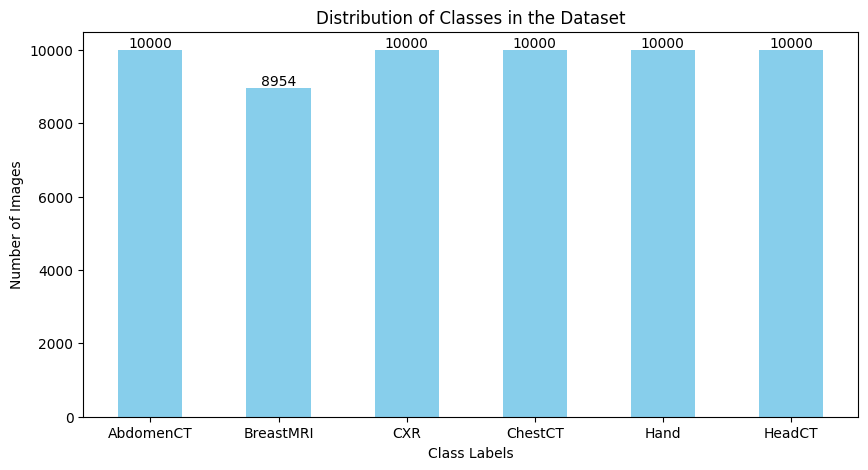

In [3]:
# Plot the distribution of classes
# i=0
classes_6={} #dictionary to store the count of each class
for unique_label in np.unique(labels):
    print(f"Label '{unique_label}' count: {np.sum(labels == unique_label)}")
    # i += 1
    classes_6[unique_label]=np.sum(labels == unique_label)

# print(f"Label '{unique_label}' {np.min(np.sum(labels == unique_label))}")
print (f"classes_6: {classes_6}")

# Plot the distribution of classes
plt.figure(figsize=(10, 5))
bar=plt.bar(classes_6.keys(), classes_6.values(), color='skyblue', width=0.5)
plt.xlabel('Class Labels')
plt.ylabel('Number of Images')
plt.title('Distribution of Classes in the Dataset')
plt.bar_label(bar,labels=classes_6.values(), label_type='edge', fontsize=10, color='black')
